In [28]:
# Librerias esenciales

import os
from pathlib import Path
import shutil
from astropy.io import fits
from lacosmic import remove_cosmics
import matplotlib.pyplot as plt
import numpy as np
from joblib import Parallel, delayed
#import pyraf
from pyraf import iraf

cannot access host 'iraf.noao.edu:80'


In [ ]:
class Plotganizer:
    def __init__(self,MAIN_FOLDER=None):
        self.MAIN_FOLDER = MAIN_FOLDER
        # Coordenadas de San Pedro Martir
        self.SITE_INFO = {
            "SITELAT": 31.04417,
            "SITELONG": -115.46361,
            "SITELEV": 2800,
        }

        self.folders = ["ARCS", "FLATS", "OBJS", "BIAS", "IMAGES", "FOCUS"]
        
        #self.executor()

    # Identificacion del tipo de imagen con que se esta tratando

    def name_assignment(self,name=''):
        if name != '':
            if "arc" in name.lower():
                return ['comp','ThAr','ARCS']
            elif "bias" in name.lower():
                return ['zero','Bias','BIAS']
            elif "flat" in name.lower():
                return ['flat','Flat','FLATS']
            elif "focus" in name.lower():
                return ['object','Focus']
            elif "image" in name.lower():
                return ['object','Image','IMAGES']
            else:
                if "test" in name.lower():
                    return ['object','Test','OBJS']
                else:
                    if 'N' in name:
                        return ['object',(name.replace('N','NGC').replace('.fits','')),'OBJS']
                    if 'M' in name:
                        return ['object',(name.replace('M','MESSIER')).replace('.fits',''),'OBJS']
                    if 'J' in name:
                        return ['object',name.replace('.fits',''),'OBJS']
                

        # Agregar informacion adicional a los headers

    def header_addition(self,file='',folder=''):
        if file != '' and folder != '':
            with fits.open(folder+file, mode="update") as hdul:
                header = hdul[0].header

                for key, value in self.SITE_INFO.items():
                    if key not in header:
                        header[key] = value

                imagetyp, object_name = self.name_assignment(file)[0:2]

                if imagetyp is not None:
                    header["IMAGETYP"] = imagetyp

                if object_name is not None:
                    header["OBJECT"] = object_name
                hdul.flush()


    # Clasificador de archivos y arreglos de header
    def executor(self):
        if not os.path.exists(self.MAIN_FOLDER):
            raise FileNotFoundError(f"No existe la carpeta: {self.MAIN_FOLDER}")
        fits_files = [f for f in os.listdir(self.MAIN_FOLDER) if f.endswith(".fits")]
        fits_files.sort()

        print(f"Encontrados {len(fits_files)} archivos FITS.")

        for file in fits_files:
            self.header_addition(file, self.MAIN_FOLDER)

        for folder in self.folders:
            dest = os.path.join(self.MAIN_FOLDER, folder)
            os.makedirs(dest, exist_ok=True)

        for file in fits_files:
            fits_path = self.MAIN_FOLDER + file
            dest_folder = self.MAIN_FOLDER + self.name_assignment(file)[-1] + "/"
            shutil.move(str(fits_path), str(dest_folder))
        
        dest_test = os.path.join(self.MAIN_FOLDER,'OBJS/TEST/')
        os.makedirs(dest_test, exist_ok=True)

        test_files = [f for f in os.listdir(os.path.join(self.MAIN_FOLDER,'OBJS/')) if 'test'in f.lower()]

        for file in test_files:
            fits_path = os.path.join(self.MAIN_FOLDER,'OBJS/') + file

            shutil.move(str(fits_path), str(dest_test))

        os.makedirs(os.path.join(self.MAIN_FOLDER, self.folders[0]) + '/database/', exist_ok=True)
        os.makedirs(os.path.join(self.MAIN_FOLDER, self.folders[2]) + '/database/', exist_ok=True)


    def image_plotter(self,path=''):
        if path != '':
            fits_file = fits.open(path)
            data = fits_file[0].data
            fig = plt.figure(figsize=(15, 15))
            ax = fig.add_subplot(1, 1, 1)
            # 1. Usamos cmap='Greys' para escala de grises (o 'gist_yarg' para el inverso)
            # 2. Ajustamos vmin y vmax para "estirar" el contraste y que se vea claro
            vmin = np.percentile(data, 5)   # Valor mínimo (ajusta el fondo)
            vmax = np.percentile(data, 95)  # Valor máximo (ajusta el brillo de las líneas)

            if 'msk' in path:
                im = ax.imshow(data, 
                            cmap='viridis', 
                            origin='lower', 
                            vmin=vmin, 
                            vmax=vmax, 
                            aspect='auto') # 'auto' ayuda si la imagen se ve muy estirada
            else:
                im = ax.imshow(data, 
                            cmap='viridis', 
                            origin='lower',
                            aspect='auto') # 'auto' ayuda si la imagen se ve muy estirada

                # Guardamos la imagen
            fig.savefig(path.replace('.fits', '.png'),dpi=150)
            
            # CRUCIAL: Cerramos la figura para que no se renderice en el notebook
            plt.close(fig)
            
            # Cerramos el archivo fits para liberar memoria
            fits_file.close()

    def png_x_folder(self):
        if not os.path.exists(self.MAIN_FOLDER):
            return

        # 1. Obtener solo carpetas reales
        folders = [f for f in os.listdir(self.MAIN_FOLDER) 
                   if os.path.isdir(os.path.join(self.MAIN_FOLDER, f))]
        folders.sort()

        for folder in folders:
            tmp_nameF = os.path.join(self.MAIN_FOLDER, folder)
            
            # 2. Archivos FITS que NO tienen su PNG listo
            fits_to_process = [
                f for f in os.listdir(tmp_nameF) 
                if f.endswith(".fits") and not os.path.exists(os.path.join(tmp_nameF, f.replace('.fits', '.png')))
            ]
            fits_to_process.sort()

            if fits_to_process:
                # 3. Paralelismo directo sobre la función de dibujo
                # Pasamos la ruta completa del FITS a procesar
                Parallel(n_jobs=-1)(
                    delayed(self.image_plotter)(os.path.join(tmp_nameF, f)) 
                    for f in fits_to_process
                )                           

        

In [84]:
work_dir = '/home/hollman/GEHR_specs/2023jun_spm/nite01/'

In [38]:
Plotganizer(work_dir).executor()

Encontrados 74 archivos FITS.


In [39]:
Plotganizer(work_dir).png_x_folder()

In [40]:
# Creador de listas

def list_generator(FOLDER=os.getcwd(), List_in='', List_out='', out_key='',img_type=''):

    fits_files = [f for f in os.listdir(FOLDER) if f.endswith(".fits") and img_type in f.lower()]

    fits_files.sort()

    path_in = os.path.join(FOLDER, List_in)

    if not os.path.exists(path_in):
        with open(os.path.join(FOLDER, f'{List_in}'), "w") as infile:
            for file in fits_files:
                infile.write(f"{FOLDER}/{file}" + "\n")

    with open(os.path.join(FOLDER, f'{List_out}'), "w") as outfile:
        for file in fits_files:
            if not os.path.exists(path_in):
                outfile.write(f"{FOLDER}/{file.replace('.fits', '')}_{out_key}.fits" + "\n")
            else:
                tmp_name = file.replace('.fits', '')
                tmp_name = tmp_name.replace(f"_{img_type}", "")
                outfile.write(f"{FOLDER}/{tmp_name}_{out_key}.fits\n")

In [41]:
# Creacion de la lista para los bias

list_generator(FOLDER=f'{work_dir}BIAS', 
               List_in='Bias_raw', 
               List_out='Bias_trim', 
               out_key='trim',
               img_type='bias')

In [4]:
# Corte de las imagenes

iraf.noao()
iraf.imred()
iraf.ccdred()

imred/:
 argus/         ctioslit/       hydra/          kpnocoude/      vtel/
 bias/          dtoi/           iids/           kpnoslit/
 ccdred/        echelle/        irred/          quadred/
 crutil/        generic/        irs/            specred/
ccdred/:
 badpiximage    ccdlist         combine         mkillumcor      setinstrument
 ccdgroups      ccdmask         darkcombine     mkillumflat     zerocombine
 ccdhedit       ccdproc         flatcombine     mkskycor
 ccdinstrument  ccdtest         mkfringecor     mkskyflat


In [43]:
#iraf.set(datadir = '/home/hollman/GEHR_specs/2023jun_spm/nite01/BIAS/')
# 3. Ejecutar ccdproc con todos tus parámetros


iraf.ccdproc(
    images = str(f'@{work_dir}BIAS/Bias_raw'),
    output = str(f'@{work_dir}BIAS/Bias_trim'),
    ccdtype = "zero",
    max_cache = 0,
    noproc = "no",
    fixpix = "no",
    overscan = "no",
    trim = "yes",
    zerocor = "no",
    darkcor = "no",
    flatcor = "no",
    illumcor = "no",
    fringecor = "no",
    readcor = "no",
    scancor = "no",
    readaxis = "line",
    trimsec = "[5:1024,152:1024]",
    minreplace = 1.0,
    scantype = "shortscan",
    nscan = 1,
    interactive = "no",
    function = "legendre",
    order = 2,
    sample = "*",
    naverage = 1,
    niterate = 1,
    low_reject = 3.0,
    high_reject = 3.0,
    grow = 0.0
)

Plotganizer(work_dir).png_x_folder()

In [44]:
iraf.zerocombine( 
    input = f'@{work_dir}BIAS/Bias_trim',
    output = f"{work_dir}BIAS/masterbias.fits",
    combine = "average",
    reject = "minmax",
    ccdtype = "zero",
    process = "no",
    delete = "no",
    clobber = "no",
    scale = "none",
    nlow = 0,
    nhigh = 1,
    nkeep = 1,
    mclip = "yes",
    lsigma = 3.0,
    hsigma = 3.0,
    rdnoise = 0.0,
    gain = 1.0,
    snoise = 0.0,
    pclip = -0.5,
    blank = 0.0
)
Plotganizer(work_dir).png_x_folder()

In [45]:
# Creacion de la lista para los flats

list_generator(FOLDER=f'{work_dir}FLATS', 
               List_in='Flat_raw', 
               List_out='Flat_trim', 
               out_key='trim',
               img_type='flat')

In [46]:
iraf.ccdproc(
    images = f'@{work_dir}FLATS/Flat_raw',
    output = f'@{work_dir}FLATS/Flat_trim',
    ccdtype = "flat",
    max_cache = 0,
    noproc = "no",
    fixpix = "no",
    overscan = "no",
    trim = "yes",
    zerocor = "yes",
    darkcor = "no",
    flatcor = "no",
    illumcor = "no",
    fringecor = "no",
    readcor = "no",
    scancor = "no",
    readaxis = "line",
    trimsec = "[5:1024,152:1024]",
    zero = f"{work_dir}BIAS/masterbias.fits",
    minreplace = 1.0,
    scantype = "shortscan",
    nscan = 1,
    interactive = "no",
    function = "legendre",
    order = 2,
    sample = "*",
    naverage = 1,
    niterate = 1,
    low_reject = 3.0,
    high_reject = 3.0,
    grow = 0.0
)

Plotganizer(work_dir).png_x_folder()

In [47]:
iraf.flatcombine(
    input = f'@{work_dir}FLATS/Flat_trim',
    output = f'{work_dir}FLATS/masterflat.fits',
    combine = "median",
    reject = "avsigclip",
    ccdtype = "flat",
    process = "no",
    subsets = "no",
    delete = "no",
    clobber = "no",
    scale = "mode",
    nlow = 3,
    nhigh = 3, 
    nkeep = 10,
    mclip = "yes", 
    lsigma = 2.5, 
    hsigma = 2.5, 
    rdnoise = "RDNOISE", 
    gain = "GAIN", 
    snoise = "0.0", 
    pclip = -0.5, 
    blank = 1.0
)
Plotganizer(work_dir).png_x_folder()

In [50]:
iraf.noao()
iraf.twodspec()
iraf.longslit()

longslit/:
 aidpars@       deredden        identify        sarith          specplot
 autoidentify   dopcor          illumination    scopy           specshift
 background     extinction      lcalib          sensfunc        splot
 bplot          fceval          lscombine       setairmass      standard
 calibrate      fitcoords       reidentify      setjd           transform
 demos          fluxcalib       response        sflip


In [55]:
iraf.set(stdgraph="xgterm")

iraf.response( 
    calibration = f'{work_dir}FLATS/masterflat.fits',
    normalization = f'{work_dir}FLATS/masterflat.fits',
    response = f'{work_dir}FLATS/FlatNmaster.fits',
    interactive = "yes",
    threshold = "INDEF",
    sample = "*",
    naverage = 1,
    function = "spline3",
    order = 5, # Esto habria que probarlo hasta con 1000 a ver si se arregla lo de la fuga de luz
    low_reject = 3.0,
    high_reject = 3.0,
    niterate = 1,
    grow = 0.0,
    graphics = "stdgraph"
)


Fit the normalization spectrum for /home/hollman/GEHR_specs/2023jun_spm/nite01/FLATS/masterflat.fits interactively (yes): 

Killing IRAF task `response'


KeyboardInterrupt: 

In [88]:
fits_trim = fits.open('/home/hollman/GEHR_specs/2023jun_spm/nite01/ARCS/Arc0012o_trim.fits')
data_ = fits_trim[0].data


clean_img, cr_mask = remove_cosmics(data = data_,
                                    effective_gain= 1.0,
                                    readnoise= 5.0,
                                    maxiter=4,
                                    cr_threshold=4.5,
                                    neighbor_threshold=0.3,
                                    contrast=7.0,
                                    border_mode='mirror')

cr_mask = cr_mask.astype(int)


INFO: Iteration 1: Found 264 cosmic-ray pixels, Total: 264 [lacosmic.core]
INFO: Iteration 2: Found 11 cosmic-ray pixels, Total: 275 [lacosmic.core]
INFO: Iteration 3: Found 0 cosmic-ray pixels, Total: 275 [lacosmic.core]


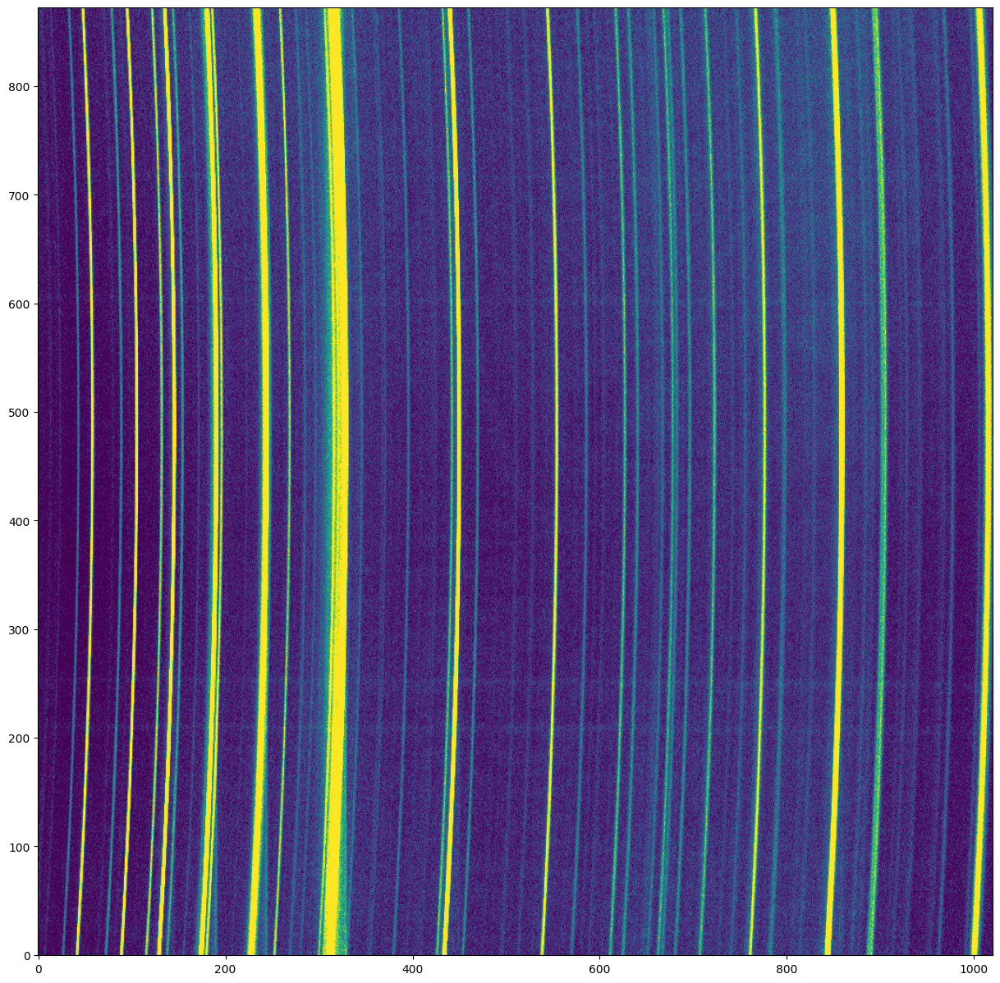

In [91]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1)
# 1. Usamos cmap='Greys' para escala de grises (o 'gist_yarg' para el inverso)
# 2. Ajustamos vmin y vmax para "estirar" el contraste y que se vea claro
vmin = np.percentile(clean_img, 5)   # Valor mínimo (ajusta el fondo)
vmax = np.percentile(clean_img, 95)  # Valor máximo (ajusta el brillo de las líneas)
im = ax.imshow(clean_img, 
            cmap='viridis', 
            origin='lower', 
            vmin=vmin, 
            vmax=vmax, 
            aspect='auto')

In [97]:
# Remocion de cosmicos

path_in = '/home/hollman/GEHR_specs/2023jun_spm/nite01/ARCS/Arcs_trim'

with open(path_in, "r") as infile:
    for line in infile:
        
        if 'Arc0001o_trim' in line:
            line = line.strip() # Reemplaza el replace('\n','')
            cr_file = line.replace('trim', 'crLA')
            msk_file = line.replace('trim', 'mskLA')

            # Abrimos el original para leer datos y header
            with fits.open(line) as hdul_orig:
                data_ = hdul_orig[0].data
                header_ = hdul_orig[0].header

                # Ejecución del algoritmo
                if 'arc' in line.lower():
                    clean_img, cr_mask = remove_cosmics(data=data_, 
                                                        effective_gain=1.0, 
                                                        readnoise=5.0, 
                                                        maxiter=4, 
                                                        cr_threshold=4.5, 
                                                        neighbor_threshold=0.3, 
                                                        contrast=7.0, 
                                                        border_mode='mirror')
                else:
                    clean_img, cr_mask = remove_cosmics(data=data_, 
                                                        effective_gain=1.0, 
                                                        readnoise=5.0, 
                                                        maxiter=6, 
                                                        cr_threshold=3.5, 
                                                        neighbor_threshold=0.25, 
                                                        contrast=7.0, 
                                                        border_mode='mirror')

                # 1. Guardar imagen limpia (crLA)
                # Creamos un PrimaryHDU nuevo con la data limpia y el header original
                hdu_clean = fits.PrimaryHDU(data=clean_img, header=header_)
                hdu_clean.writeto(cr_file, overwrite=True)

                # 2. Guardar máscara (mskLA)
                # Convertimos máscara a entero (int16 es suficiente y ahorra espacio)
                hdu_mask = fits.PrimaryHDU(data=cr_mask.astype('int16'), header=header_)
                hdu_mask.writeto(msk_file, overwrite=True)



INFO: Iteration 1: Found 248 cosmic-ray pixels, Total: 248 [lacosmic.core]
INFO: Iteration 2: Found 6 cosmic-ray pixels, Total: 254 [lacosmic.core]
INFO: Iteration 3: Found 0 cosmic-ray pixels, Total: 254 [lacosmic.core]


In [100]:
fits_cR = fits.open('/home/hollman/GEHR_specs/2023jun_spm/nite01/ARCS/Arc0001o_mskLA.fits')
data_CR = fits_cR[0].data

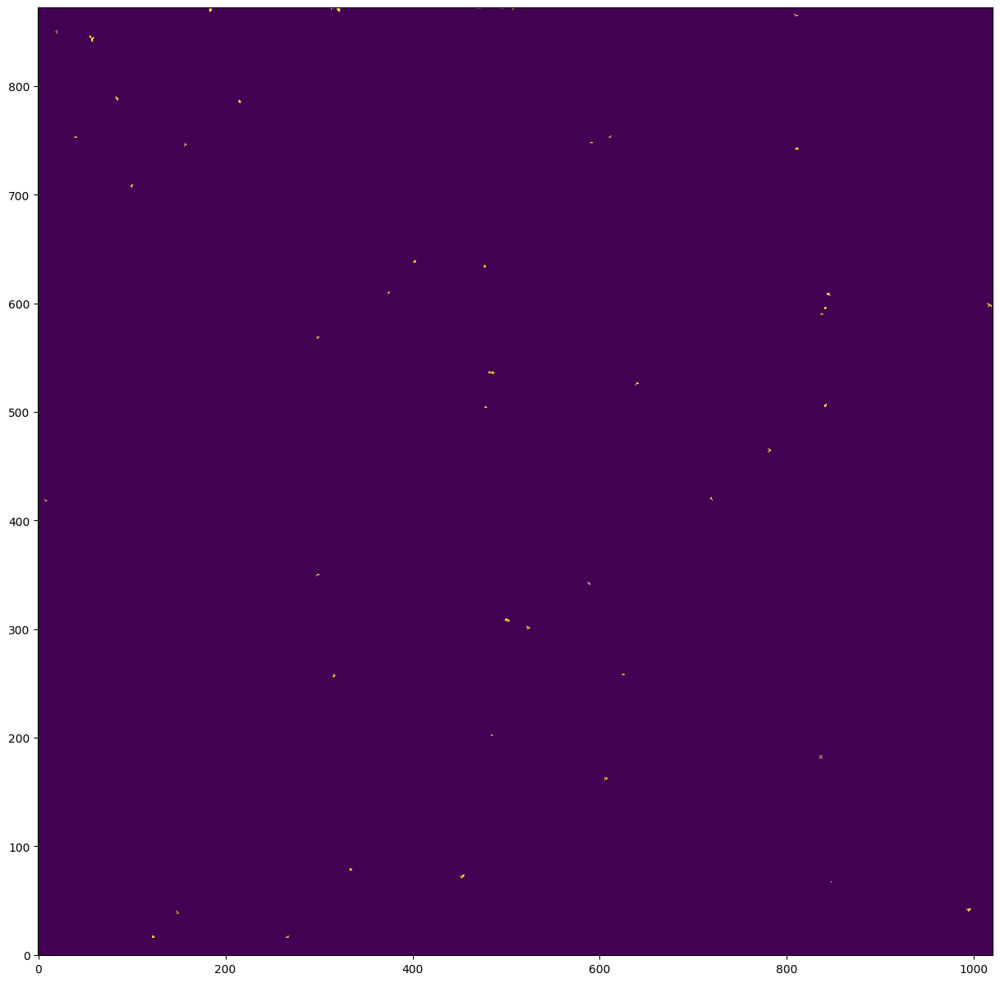

In [102]:
fig = plt.figure(figsize=(15, 15))
ax = fig.add_subplot(1, 1, 1)
# 1. Usamos cmap='Greys' para escala de grises (o 'gist_yarg' para el inverso)
# 2. Ajustamos vmin y vmax para "estirar" el contraste y que se vea claro
vmin = np.percentile(data_CR, 5)   # Valor mínimo (ajusta el fondo)
vmax = np.percentile(data_CR, 95)  # Valor máximo (ajusta el brillo de las líneas)
im = ax.imshow(data_CR, 
            cmap='viridis', 
            origin='lower',
            aspect='auto')

[None]

In [ ]:
import ast
import os
from pprint import pprint

def leer_o_crear_logfile(ruta):
    # 1. Definimos los valores por defecto
    dict_nulo = {
        '1': [False, ' Bias list'],
        '2': [False, ' Bias ccdproc'],
        '3': [False, ' Masterbias'],
        '4': [False, ' Flat list'],
        '5': [False, ' Flat ccdproc'],
        '6': [False, ' Masterflat'],
        '7': [False, ' Normalize flat'],
        '8': [False, ' Arc list'],
        '9': [False, ' Arc ccdproc'],
        '10': [False, ' Arc cosmic removal'],
        '11': [False, ' Obj list'],
        '12': [False, ' Obj ccdproc'],
        '13': [False, ' Obj cosmic removal']
    }

    if not os.path.exists(ruta):
        # 3. Si el archivo no existe, lo creamos con saltos de línea
        print(f"Archivo no encontrado. Creando {ruta} con valores iniciales...")
        with open(ruta, 'w') as f:
            # Usamos pformat para convertir el dict a un string bonito con saltos de línea
            import pprint
            f.write(pprint.pformat(dict_nulo, sort_dicts=False))
        return dict_nulo

    try:
        # 2. Intentamos abrir el archivo para leer
        with open(ruta, 'r') as f:
            contenido = f.read().strip()
            
            if not contenido: 
                return dict_nulo
            
            # ast.literal_eval ignora los saltos de línea, así que leerá el dict normal
            return ast.literal_eval(contenido)

    except (SyntaxError, ValueError):
        # Por si el archivo tiene errores de formato
        print(f"Error de formato en {ruta}. Cargando valores por defecto.")
        return dict_nulo

In [115]:
a = 12
b = 3
# Fómula: (a + b - 1) // b
resultado = (a + b - 1) // b
print(resultado)  # Salida: 4

4


In [119]:
import ast

lista_final = []

with open('/home/hollman/GEHR_specs/2023jun_spm/nite01/OBJS/association', 'r') as f:
    for linea in f:
        linea = linea.strip()
        
        if linea:
            # Convierte el string "['A', 'B']" en una lista ['A', 'B']
            dupla = ast.literal_eval(linea)
            
            # Aquí ya puedes trabajar con los dos componentes
            print(f"Objeto: {dupla[0]}, Arco: {dupla[1]}")

Objeto: N4214A0001, Arco: Arc0001
Objeto: N4214A0002, Arco: Arc0002
Objeto: N4214A0003, Arco: Arc0003
Objeto: N5204A0001, Arco: Arc0004
Objeto: N5204A0002, Arco: Arc0005
Objeto: N5204A0003, Arco: Arc0006
Objeto: N7331A0001, Arco: Arc0012
Objeto: N7331B0001, Arco: Arc0008
Objeto: N7331B0002, Arco: Arc0009
Objeto: N7331B0003, Arco: Arc00010


In [4]:
FoV_slit = fits.open('/home/hollman/GEHR_specs/2023jun_spm/nite01/IMAGES/Image_N42140001o.fits')[0].header

In [3]:
from astropy.coordinates import SkyCoord, FK5
import astropy.units as u

In [6]:


# 1. Ingresa tus valores en formato sexagesimal
# RA: 'HH:MM:SS' o 'HH MM SS'
# DEC: 'DD:MM:SS' o 'DD MM SS'
ra_sex = FoV_slit['RA']
dec_sex = FoV_slit['DEC']

# 2. Creamos el objeto SkyCoord
# Definimos el frame como FK5 y el equinoccio en 2023.8
c_2023 = SkyCoord(
    ra=ra_sex, 
    dec=dec_sex, 
    unit=(u.hourangle, u.deg), # RA en horas, DEC en grados
    frame='fk5', 
    equinox='J2023.4'
)

# 3. Transformamos al equinoccio J2000
c_j2000 = c_2023.transform_to(FK5(equinox='J2000'))

# 4. Mostramos los resultados en formato sexagesimal para Aladin
print("--- Coordenadas Originales (2023.8) ---")
print(c_2023.to_string('hmsdms'))

print("\n--- Coordenadas Convertidas (J2000) ---")
print(c_j2000.to_string('hmsdms', sep=' ', precision=5))



--- Coordenadas Originales (2023.8) ---
12h16m53.06s +36d12m14.1s

--- Coordenadas Convertidas (J2000) ---
12 15 42.73543 +36 20 01.87110


In [8]:
Fet = fits.open('/home/hollman/GEHR_specs/2023jun_spm/nite01/OBJS/N4214A0001o_1d.fits')

aver = Fet[0].data

In [10]:
Fet.info()

Filename: /home/hollman/GEHR_specs/2023jun_spm/nite01/OBJS/N4214A0001o_1d.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     143   (1015,)   float32   


In [40]:
def plot_espectro_1d(ruta_fits):
    with fits.open(ruta_fits) as hdul:
        data = hdul[0].data
        header = hdul[0].header
        
        # 1. Obtener el flujo (eje Y)
        # apall a veces guarda varias dimensiones (flujo, background, etc.)
        # Si es extracción estándar, el flujo está en la primera dimensión
        if data.ndim > 1:
            flujo = data[0] 
        else:
            flujo = data

        # 2. Reconstruir la longitud de onda (eje X) usando el Header
        # IRAF usa: Wavelength = CRVAL1 + (pixel - CRPIX1) * CDELT1
        try:
            n_pixeles = header['NAXIS1']
            crval = header['CRVAL1']
            cdelt = header['CDELT1']
            crpix = header.get('CRPIX1', 1) # Por defecto 1 si no existe
            
            # Crear el arreglo de longitud de onda
            referencia_pix = np.arange(n_pixeles) + 1
            longitud_onda = crval + (referencia_pix - crpix) * cdelt
            
        except KeyError:
            print("No se encontraron las llaves WCS. Ploteando en píxeles.")
            longitud_onda = np.arange(len(flujo))

        fig = plt.figure(figsize=(15, 10))
        ax = fig.add_subplot()
        ax.step(longitud_onda, flujo, where='mid', color='black', lw=1)
        ax.axvline(x=6564.6, color='r', linestyle='--')
        ax.set_xlabel(f"Longitud de Onda ({header.get('CUNIT1', 'Å')})")
        ax.set_ylabel("Flujo (ADUs / Electrones)")
        ax.set_title(f"Espectro: {header.get('OBJECT', 'Sin nombre')}")
        ax.grid(alpha=0.3)
        fig.savefig(ruta_fits.replace('.fits', '.png'),dpi=150)
        plt.close(fig)

In [45]:
plot_espectro_1d('/home/hollman/GEHR_specs/2023jun_spm/nite01/OBJS/NGC4214AcombMED.fits')

In [2]:
from scipy.ndimage import median_filter

In [ ]:
with fits.open(f'{work_dir}FLATS/masterflat.fits') as hdul:
    data = hdul[0].data.copy()
    header = hdul[0].header
    
# Identifica la columna de la franja (inspeccionala con imarith/imexamine)
# Por ejemplo, si la franja está en columnas 100-115:
fuga_mask = np.zeros(data.shape, dtype=bool)
fuga_mask[:,275:326] = True  # ajusta los índices

# Reemplaza con mediana local suavizada
data_smooth = median_filter(data, size=(1, 200))  # suaviza en dispersion
data[fuga_mask] = data_smooth[fuga_mask]

fits.writeto(f'{work_dir}FLATS/masterflat_masked.fits', data, header, overwrite=True)

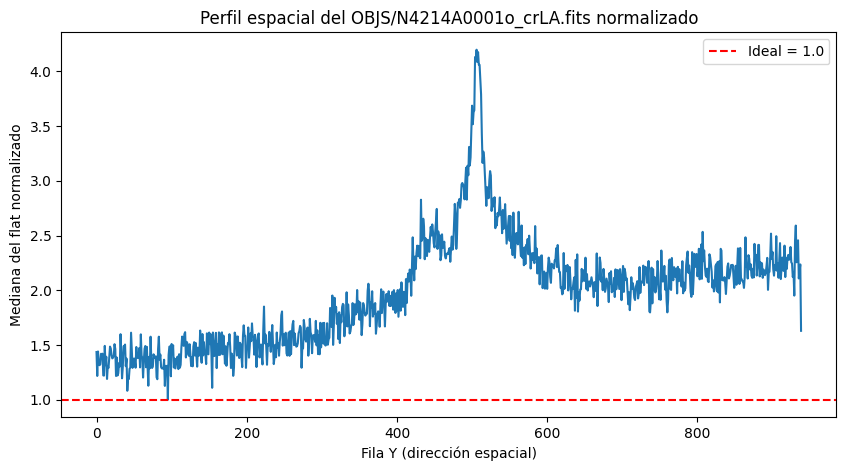

In [ ]:
with fits.open(f'{work_dir}OBJS/N4214A0001o_crLA.fits') as hdul: #f'{work_dir}FLATS/FlatNmaster.fits'
    flat = hdul[0].data
mediana = np.median(flat, axis=1) #f'{work_dir}OBJS/N4214A0001o_crLA.fits'

plt.figure(figsize=(10,5))
plt.plot(mediana)
plt.axhline(1.0, color='r', linestyle='--', label='Ideal = 1.0')
plt.xlabel('Fila Y (dirección espacial)')
plt.ylabel('Mediana de la imagen')
plt.title(f'Perfil espacial del OBJS/N4214A0001o_crLA.fits normalizado')
plt.legend()
#plt.savefig(f'{work_dir}FLATS/perfil_FlatNmaster.png', dpi=150)

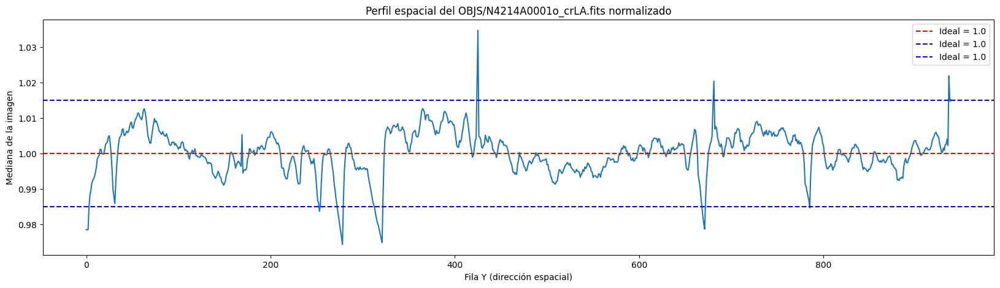

In [85]:
with fits.open(f'{work_dir}FLATS/FlatNmaster.fits') as hdul: #f'{work_dir}FLATS/FlatNmaster.fits'
    flat = hdul[0].data
mediana = np.median(flat, axis=1) #f'{work_dir}OBJS/N4214A0001o_crLA.fits'

plt.figure(figsize=(20,5))
plt.plot(mediana)
plt.axhline(1.0, color='r', linestyle='--', label='Ideal = 1.0')
plt.axhline(1.015, color='b', linestyle='--', label='Ideal = 1.0')
plt.axhline(0.985, color='b', linestyle='--', label='Ideal = 1.0')
plt.xlabel('Fila Y (dirección espacial)')
plt.ylabel('Mediana de la imagen')
plt.title(f'Perfil espacial del OBJS/N4214A0001o_crLA.fits normalizado')
plt.legend()
#plt.savefig(f'{work_dir}FLATS/perfil_FlatNmaster.png', dpi=150)

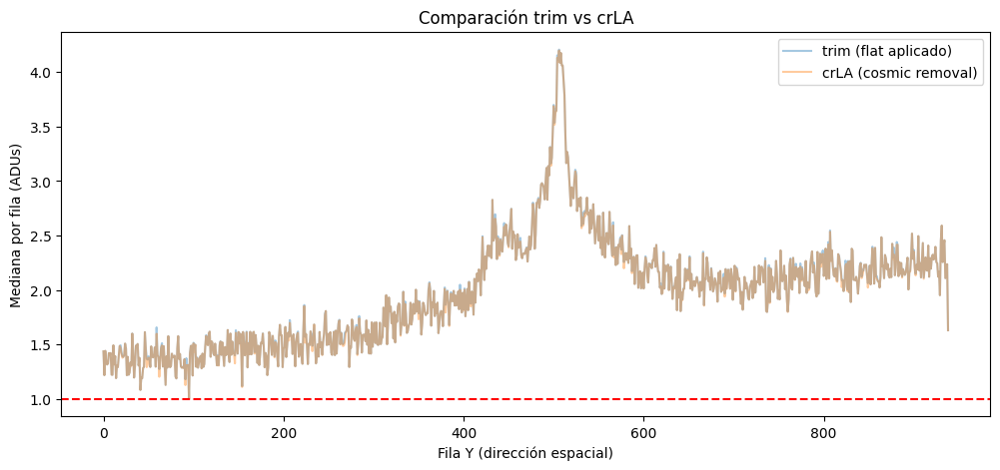

In [43]:
archivos = {
    'trim (flat aplicado)':  f'{work_dir}OBJS/N4214A0001o_trim.fits',
    'crLA (cosmic removal)': f'{work_dir}OBJS/N4214A0001o_crLA.fits',
}

fig, ax = plt.subplots(figsize=(12, 5))
for label, path in archivos.items():
    with fits.open(path) as hdul:
        data = hdul[0].data
    mediana = np.median(data, axis=1)
    ax.plot(mediana, label=label,alpha=0.4)

ax.axhline(1.0, color='r', linestyle='--')
ax.set_xlabel('Fila Y (dirección espacial)')
ax.set_ylabel('Mediana por fila (ADUs)')
ax.legend()
ax.set_title('Comparación trim vs crLA')
plt.savefig(f'{work_dir}OBJS/diagnostico_gradiente.png', dpi=150)

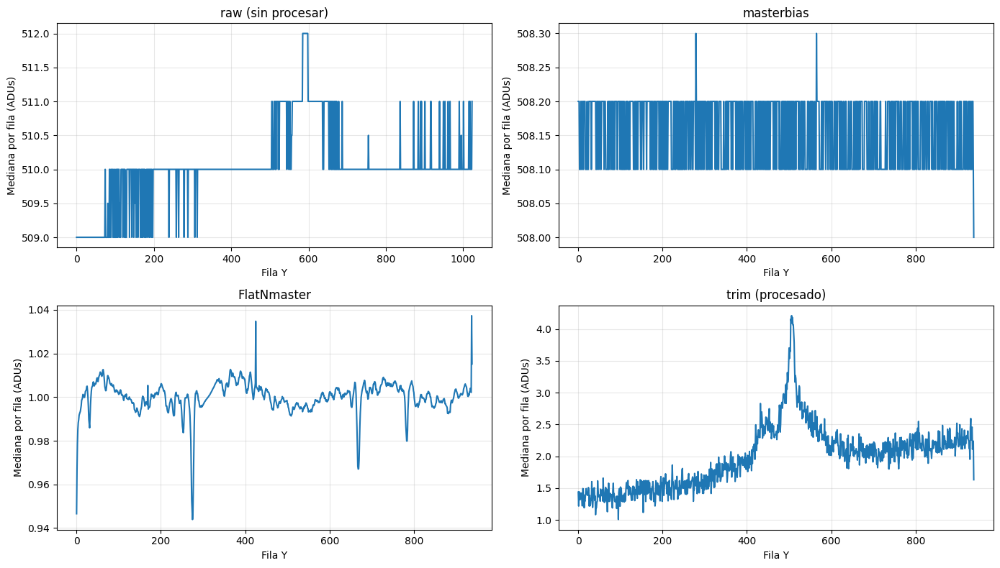

In [47]:
# Cambia estos nombres a los archivos reales de esa noche
archivos = {
    'raw (sin procesar)' : f'{work_dir}OBJS/N4214A0001o.fits',
    'masterbias'         : f'{work_dir}BIAS/masterbias.fits',
    'FlatNmaster'        : f'{work_dir}FLATS/FlatNmaster.fits',
    'trim (procesado)'   : f'{work_dir}OBJS/N4214A0001o_trim.fits',
}

fig, axes = plt.subplots(2, 2, figsize=(14, 8))
axes = axes.flatten()

for ax, (label, path) in zip(axes, archivos.items()):
    try:
        with fits.open(path) as hdul:
            data = hdul[0].data
        mediana = np.median(data, axis=1)
        ax.plot(mediana)
        ax.set_title(label)
        ax.set_xlabel('Fila Y')
        ax.set_ylabel('Mediana por fila (ADUs)')
        ax.grid(alpha=0.3)
    except FileNotFoundError:
        ax.set_title(f'{label} — NO ENCONTRADO')

plt.tight_layout()
plt.savefig(f'{work_dir}diagnostico_origen_gradiente.png', dpi=150)

In [86]:
from astropy.io import fits
hdul = fits.open('/home/hollman/GEHR_specs/2023jun_spm/nite01/OBJS/N4214A0001o_wlcal.fits')
hdul.info()

Filename: /home/hollman/GEHR_specs/2023jun_spm/nite01/OBJS/N4214A0001o_wlcal.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     143   (1015, 939)   float32   
  1                1 ImageHDU       143   (1015, 939)   float32   
  2                1 ImageHDU       143   (1015, 939)   float32   


In [7]:
from utils import leer_o_crear_logfile
from utils import notify
from utils import guardar_logfile
from utils import list_generator
from utils import Plotganizer
import os
import random
import shutil
import ast

In [17]:
work_dir = '/home/hollman/GEHR_specs/2023jun_spm/nite01/'

In [2]:
WL_cal_groups = [f for f in os.listdir(f'{work_dir}ARCS') if 'waveleng_calg' in f.lower()]
WL_cal_groups.sort()

NameError: name 'os' is not defined

In [19]:
WL_cal_groups

['WaveLeng_calG1', 'WaveLeng_calG2', 'WaveLeng_calG3', 'WaveLeng_calG4']

In [23]:
arc_files = [f for f in os.listdir(f'{work_dir}ARCS') if f.endswith(".fits") and 'cr' in f.lower()]
arc_files.sort()

In [25]:
arc_files

['Arc0001o_crLA.fits',
 'Arc0002o_crLA.fits',
 'Arc0003o_crLA.fits',
 'Arc0004o_crLA.fits',
 'Arc0005o_crLA.fits',
 'Arc0006o_crLA.fits',
 'Arc0007o_crLA.fits',
 'Arc0008o_crLA.fits',
 'Arc0009o_crLA.fits',
 'Arc0010o_crLA.fits',
 'Arc0011o_crLA.fits',
 'Arc0012o_crLA.fits']

In [1]:
for G in range(len(WL_cal_groups)):
    grupo_n = []
    with open(f'{work_dir}ARCS/WaveLeng_calG{G+1}', "r") as arc_individual:
        for line in arc_individual:
            #print(line)
            grupo_n.append(line)
        #print("\n")
    chosen = grupo_n[0] # For identify, the rest are reidentify 
    grupo_n.remove(chosen) # Aqui se remueve el primero que es con el que se calibra
    print(grupo_n, chosen,"\n")

    if len(grupo_n) > 1:
        with open(f'{work_dir}ARCS/reidentify_{G+1}', "w") as reidentify_list:
            for i in grupo_n:
                reidentify_list.write(f'{i}')
        print(chosen)
        # identify
        # reidentify
    else:
        # identify
        print('Unicamente identify')

    

NameError: name 'WL_cal_groups' is not defined

In [34]:
mi_diccionario = {"nombre": "Ana", "edad": 28, "ciudad": "Madrid"}
claves = list(mi_diccionario.keys())

print(claves) 

['nombre', 'edad', 'ciudad']


In [35]:
mi_diccionario["nombre"]

'Ana'

In [39]:
dict_mixto = {"a": [False, ';'], "b": [True, ';'], "c": [True, ';']}

# Accede al índice [0] de cada lista para verificar si es estrictamente True
todos_true_estricto = all(valor[0] is True for valor in dict_mixto.values())

print(todos_true_estricto)  # Salida: True

False


In [42]:
RS = leer_o_crear_logfile(f'{work_dir}/log_reduc')

RS

{'0': [True, ' Set instrument'],
 '1': [True, ' Bias list'],
 '2': [True, ' Bias ccdproc'],
 '3': [True, ' Masterbias'],
 '4': [True, ' Flat list'],
 '5': [True, ' Flat ccdproc'],
 '6': [True, ' Masterflat'],
 '7': [True, ' Normalize flat'],
 '8': [True, ' Arc list'],
 '9': [True, ' Arc ccdproc'],
 '10': [True, ' Arc cr list'],
 '11': [True, ' Arc cosmic removal'],
 '12': [True, ' Obj list'],
 '13': [True, ' Obj ccdproc'],
 '14': [True, ' Obj cr list'],
 '15': [True, ' Obj cosmic removal'],
 '16': [True, ' WL calib'],
 '17': [True, ' FitCoords a arcos'],
 '18': [True, ' Transform a arcos'],
 '19': [False, ' Transform a objetos'],
 '20': [False, ' Busqueda de espectros calibrados y conversion a 1D'],
 '21': [False, ' Plotear espectros 1d extraidos']}

In [43]:
# Definimos la tarea actual
tarea_actual = 20  # Usamos entero para calcular las anteriores

# Generamos las llaves de las tareas anteriores: ['1', '2', ..., '19']
tareas_anteriores = [str(i) for i in range(1, tarea_actual)]

# Verificamos que absolutamente todas las anteriores existan y sean True
anteriores_listas = all(RS.get(t, [False])[0] is True for t in tareas_anteriores)

if RS['20'][0] == True:
    notify('Ya se realizo la conversion a 1D de los objetos calibrados. Se pueden revisar y/o combinar')
elif not anteriores_listas:
    notify('No se puede correr la tarea 20 porque hay tareas anteriores pendientes.')
else:
    # Realizar tarea 20
    pass



No se puede correr la tarea 20 porque hay tareas anteriores pendientes.




In [6]:
import os
import sys
import glob
import numpy as np
import  scipy.optimize as op
import matplotlib.pyplot as plt
import urllib.request
from astropy.io import fits as fits
from astropy.table import Table
#import pandas as pd
import urllib.request
import requests
import astropy.units as u
from astropy.coordinates import SkyCoord
from pathlib import Path
from numpy import savetxt
from scipy.interpolate import interp1d
import matplotlib
#matplotlib.use('Agg')
import matplotlib.pyplot as plt

import os
from astropy.table import Table
from astropy.cosmology import FlatwCDM

import numpy as np

import scipy.optimize as op

from astropy.io import ascii
import urllib.request
import requests

#!pip install ipyaladin

from astropy.coordinates import Angle, SkyCoord
from ipyaladin import Aladin, Marker
from pathlib import Path

#from astroquery.sdss import SDSS
#from astropy import coordinates as coords

from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.wcs import WCS
#from astroquery.simbad import Simbad
#from astroquery.vizier import Vizier
import matplotlib.pyplot as plt
import numpy as np

from ipyaladin import Aladin

import time

from joblib import Parallel, delayed

--- METADATOS CLAVE ---
Objeto astronómico: Image
Telescopio/Instrumento: 2.12m
Tiempo de exposición: 100.0 segundos
--- DIMENSIONES PRECISAS DEL FOV ---
FOV en X: 0.1010° (6.06 minutos de arco)
FOV en Y: 0.0999° (6.00 minutos de arco)
Tamaño total del campo: 6.06' x 6.00'


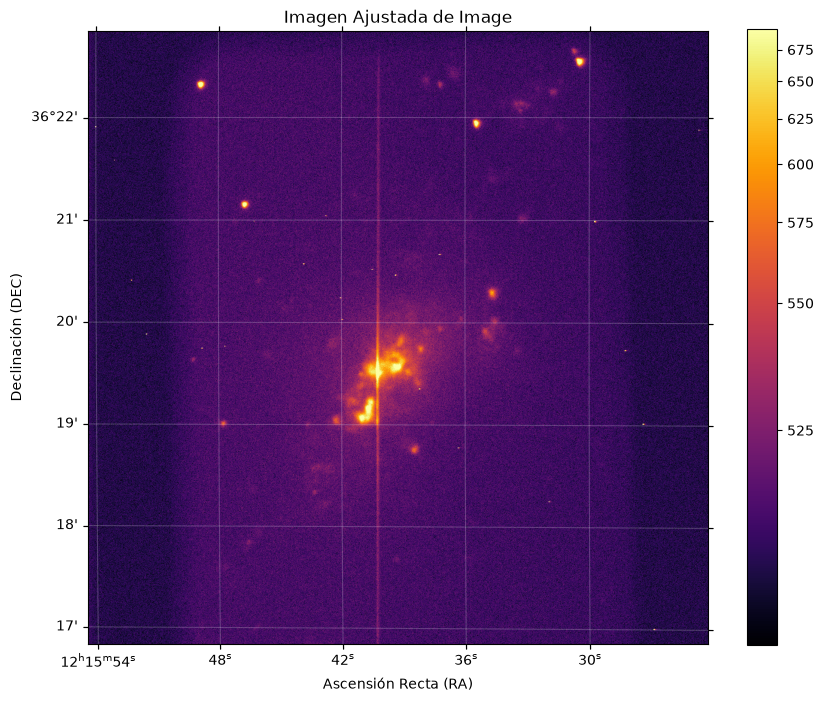

In [7]:
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from astropy.io import fits
from astropy.wcs import WCS
from astropy.visualization import simple_norm
from astropy.wcs.utils import proj_plane_pixel_scales
# 1. Abrir el archivo y extraer componentes
archivo_fits = "new-image.fits"

with fits.open(archivo_fits) as hdul:
    # Extraer metadatos (Header) y datos de la imagen
    header = hdul[0].header
    datos_imagen = hdul[0].data

    # Extraer el sistema de coordenadas celestes (WCS)
    wcs = WCS(header)

# 2. Imprimir metadatos clave en la terminal
print("--- METADATOS CLAVE ---")
print(f"Objeto astronómico: {header.get('OBJECT', 'Desconocido')}")
print(f"Telescopio/Instrumento: {header.get('TELESCOP', 'Desconocido')}")
print(f"Tiempo de exposición: {header.get('EXPTIME', 'Desconocido')} segundos")

# 1. Ajustar la norma logarítmica con percentiles agresivos
# percent=99.5 ignora el 0.5% de los pixeles más brillantes que saturan la imagen
norma = simple_norm(datos_imagen, stretch="asinh", percent=99.9)

# Opcional (Si el fondo sigue muy oscuro): 
# Si quieres estirar aún más el contraste de lo tenue, usa stretch='asinh' o stretch='sqrt'
# norma = simple_norm(datos_imagen, stretch='asinh', percent=99.0)

escala_x, escala_y = proj_plane_pixel_scales(wcs)

# 2. Multiplicar la escala por el número de pixeles de la imagen
alto_px, ancho_px = datos_imagen.shape

fov_x_grados = ancho_px * escala_x
fov_y_grados = alto_px * escala_y

# 3. Convertir a minutos de arco para que sea más fácil de leer (1 grado = 60 minutos)
fov_x_minutos = fov_x_grados * 60
fov_y_minutos = fov_y_grados * 60

print("--- DIMENSIONES PRECISAS DEL FOV ---")
print(f"FOV en X: {fov_x_grados:.4f}° ({fov_x_minutos:.2f} minutos de arco)")
print(f"FOV en Y: {fov_y_grados:.4f}° ({fov_y_minutos:.2f} minutos de arco)")
print(f"Tamaño total del campo: {fov_x_minutos:.2f}' x {fov_y_minutos:.2f}'")





# 2. Graficar con el mapa de color adecuado
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection=wcs)

# Usamos la norma calculada
im = ax.imshow(datos_imagen, cmap="inferno", origin="lower", norm=norma)

# Ajustar etiquetas
ax.set_xlabel("Ascensión Recta (RA)")
ax.set_ylabel("Declinación (DEC)")
ax.set_title(f"Imagen Ajustada de {header.get('OBJECT', 'Archivo FITS')}")

plt.colorbar(im)
plt.grid(color="white", ls="solid", alpha=0.2)
plt.show()



In [8]:
import os
import astropy.units as u
from astropy.coordinates import FK5, SkyCoord
from astropy.io import fits
from astropy.wcs import WCS
from astroquery.astrometry_net import AstrometryNet

In [9]:
astrometry_api_key = "wqkewwobfpwlvetj"  # <-- REEMPLAZA CON TU KEY REAL
astrometry = AstrometryNet()
astrometry.api_key = astrometry_api_key

# 2. Rutas de archivos
archivo_fits = "/home/hollman/GEHR_specs/2023jun_spm/nite01/IMAGES/Image_N7331A0001o.fits"
directorio, nombre_base = os.path.split(archivo_fits)
archivo_corregido = os.path.join(directorio, "corregido_" + nombre_base)

# 3. Leer el FITS original para extraer el punto de inicio de búsqueda
with fits.open(archivo_fits) as hdul:
    header = hdul[0].header
    datos_imagen = hdul[0].data

ra_sex = header["RA"]
dec_sex = header["DEC"]
epoch_val = header.get("EPOCH", 2023.4)

# Convertir coordenadas del header a grados decimales
c_original = SkyCoord(ra=ra_sex, dec=dec_sex, unit=(u.hourangle, u.deg), frame=FK5(equinox=f"J{epoch_val}"))
ra_estimada = c_original.ra.degree
dec_estimada = c_original.dec.degree

print("--- COORDENADAS TEÓRICAS (DEL FITS) ---")
print(f"Buscando cerca de RA: {ra_estimada:.5f}° | DEC: {dec_estimada:.5f}°")

# 4. Configurar los parámetros de búsqueda para acelerar el proceso
# Usamos un radio de búsqueda de 0.5 grados alrededor de la coordenada teórica
configuracion = {
    "center_ra": ra_estimada,
    "center_dec": dec_estimada,
    "radius": 0.5,
    "scale_units": "arcsecperpix",
    "scale_lower": 0.1,  # Margen inferior basado en SCALEPIX
    "scale_upper": 0.5,  # Margen superior basado en SCALEPIX (con binning)
}

--- COORDENADAS TEÓRICAS (DEL FITS) ---
Buscando cerca de RA: 339.56683° | DEC: 34.48200°


In [10]:
try:
    # Enviar la matriz de datos y los parámetros a la API
    wcs_header = astrometry.solve_from_image(archivo_fits, **configuracion)
    
    if wcs_header:
        print("\n¡ÉXITO! Astrometría resuelta.")
        
        # --- CORRECCIÓN AQUÍ: Convertir el Header devuelto en un objeto WCS real ---
        wcs_corregido = WCS(wcs_header)
        
        # 5. Calcular el nuevo centro real de la imagen usando el objeto WCS
        alto_px, ancho_px = datos_imagen.shape
        ra_real, dec_real = wcs_corregido.pixel_to_world_values(ancho_px / 2.0, alto_px / 2.0)
        
        print("\n--- NUEVAS COORDENADAS REALES (CORREGIDAS) ---")
        print(f"Centro Real -> RA: {ra_real:.5f}° | DEC: {dec_real:.5f}°")
        print(f"Desfase real corregido -> Delta RA: {ra_real - ra_estimada:.5f}° | Delta DEC: {dec_real - dec_estimada:.5f}°")
        
        # 6. Actualizar el header FITS con el WCS real y guardar el archivo nuevo
        nuevo_header = header.copy()
        
        # Mezclar el WCS corregido con la cabecera original
        nuevo_header.update(wcs_corregido.to_header())
        
        # Guardar en un nuevo archivo FITS calibrado
        fits.writeto(archivo_corregido, datos_imagen, nuevo_header, overwrite=True)
        print(f"\nArchivo guardado exitosamente en: {archivo_corregido}")
        print("Ahora puedes abrir este archivo corregido en Aladin y la grilla calzará a la perfección.")
        
    else:
        print("\nNo se pudo resolver la astrometría. Verifica los márgenes de escala o el contraste.")

except Exception as e:
    print(f"\nOcurrió un error en la conexión o procesamiento: {e}")


Solving......
¡ÉXITO! Astrometría resuelta.

--- NUEVAS COORDENADAS REALES (CORREGIDAS) ---
Centro Real -> RA: 339.29103° | DEC: 34.36427°
Desfase real corregido -> Delta RA: -0.27581° | Delta DEC: -0.11773°

Archivo guardado exitosamente en: /home/hollman/GEHR_specs/2023jun_spm/nite01/IMAGES/corregido_Image_N7331A0001o.fits
Ahora puedes abrir este archivo corregido en Aladin y la grilla calzará a la perfección.


--- INFORMACIÓN DEL ARCHIVO CALIBRADO ---
Objeto: Image
Centro Real de la imagen -> RA: 339.29102° | DEC: 34.36427°


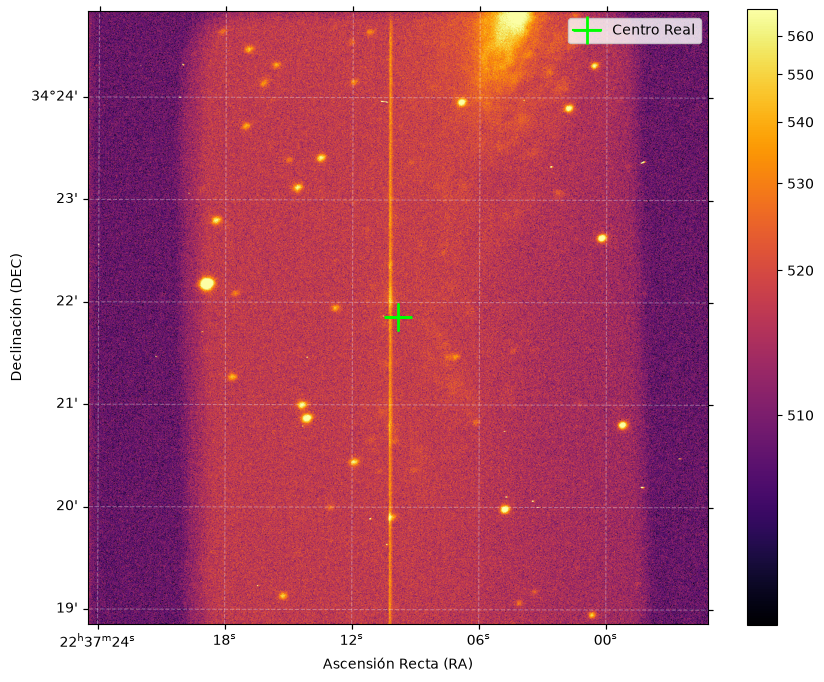

1036 1024
--- DIMENSIONES PRECISAS DEL FOV ---
FOV en X: 0.1010° (6.06 minutos de arco)
FOV en Y: 0.0999° (6.00 minutos de arco)
Tamaño total del campo: 6.06' x 6.00'


In [27]:
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.visualization import simple_norm
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales


# 1. Ruta de tu archivo FITS corregido por astrometría
archivo_fits_corregido = (
    "/home/hollman/GEHR_specs/2023jun_spm/nite01/IMAGES/corregido_Image_N7331A0001o.fits"
)

with fits.open(archivo_fits_corregido) as hdul:
    header = hdul[0].header
    datos_imagen = hdul[0].data

    # Extraer el WCS REAL calculado por Astrometry.net directamente del header
    wcs_real = WCS(header)

# 2. Dimensiones de la imagen para calcular el centro físico en píxeles
alto_px, ancho_px = datos_imagen.shape
centro_x_px = ancho_px / 2.0
centro_y_px = alto_px / 2.0

# 3. Calcular las coordenadas celestes reales en ese centro físico
ra_real, dec_real = wcs_real.pixel_to_world_values(centro_x_px, centro_y_px)

print("--- INFORMACIÓN DEL ARCHIVO CALIBRADO ---")
print(f"Objeto: {header.get('OBJECT', 'Desconocido')}")
print(f"Centro Real de la imagen -> RA: {ra_real:.5f}° | DEC: {dec_real:.5f}°")

# 4. Ajustar la norma visual (escala asinh para ver las estructuras de NGC 4214)
norma = simple_norm(datos_imagen, stretch="asinh", percent=99.7)

# 5. Graficar utilizando la proyección WCS real
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection=wcs_real)

# Mostrar la matriz de datos astronómicos
im = ax.imshow(datos_imagen, cmap="inferno", origin="lower", norm=norma)

# Dibujar la cruz exactamente en el centro geométrico (ahora calzará con el centro real en Aladin)
ax.plot(
    centro_x_px,
    centro_y_px,
    color="lime",
    marker="+",
    markersize=20,
    markeredgewidth=2,
    label="Centro Real",
)

# Configurar etiquetas de los ejes (Matplotlib y Astropy formatearán automáticamente a formato sexagesimal)
ax.set_xlabel("Ascensión Recta (RA)")
ax.set_ylabel("Declinación (DEC)")

# Añadir elementos visuales adicionales
plt.colorbar(im)
plt.grid(color="white", ls="dashed", alpha=0.3)
plt.legend(loc="upper right")

plt.show()

print(ancho_px, alto_px)

escala_x, escala_y = proj_plane_pixel_scales(wcs)

# 2. Multiplicar la escala por el número de pixeles de la imagen
alto_px, ancho_px = datos_imagen.shape

fov_x_grados = ancho_px * escala_x
fov_y_grados = alto_px * escala_y

# 3. Convertir a minutos de arco para que sea más fácil de leer (1 grado = 60 minutos)
fov_x_minutos = fov_x_grados * 60
fov_y_minutos = fov_y_grados * 60

print("--- DIMENSIONES PRECISAS DEL FOV ---")
print(f"FOV en X: {fov_x_grados:.4f}° ({fov_x_minutos:.2f} minutos de arco)")
print(f"FOV en Y: {fov_y_grados:.4f}° ({fov_y_minutos:.2f} minutos de arco)")
print(f"Tamaño total del campo: {fov_x_minutos:.2f}' x {fov_y_minutos:.2f}'")


In [31]:
ra_real * 1

np.float64(339.29102443053415)

In [24]:

aladin = Aladin(
    target=SkyCoord(ra_real, dec_real, unit="deg"),
    fov=Angle(fov_x_minutos, "arcmin"),
    height=1000,
    width=600,
    reticle_size=20,
    coo_frame="ICRSd",
    reticle_color="#08fd00",
    survey="SDSS9"
)

aladin

Descargando imagen desde el endpoint correcto de Aladin...


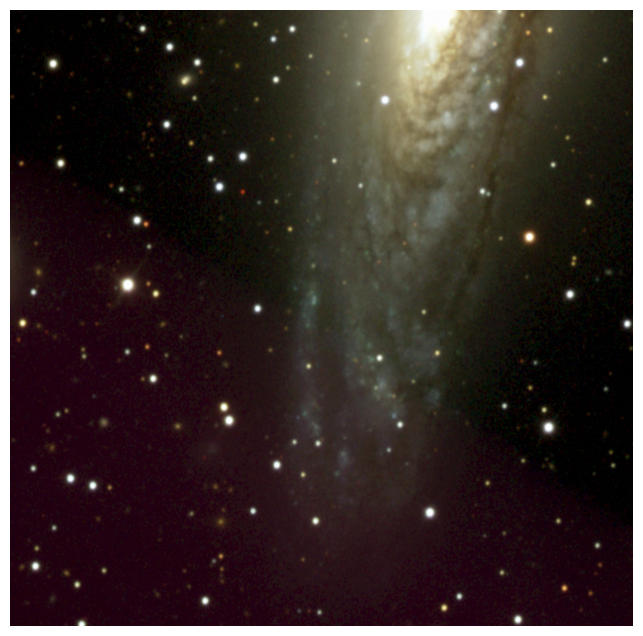

¡Imagen descargada y guardada correctamente!


In [33]:
import io
import requests
import astropy.units as u
import matplotlib.pyplot as plt
from PIL import Image

ra_real = ra_real * 1           
dec_real = dec_real * 1         
fov_x_minutos = fov_x_minutos * 1           
fov_en_grados = (fov_x_minutos * u.arcmin).to(u.deg).value

# URL OFICIAL CORREGIDA (Incluye /hips-image-services/)
url = "https://alasky.cds.unistra.fr/hips-image-services/hips2fits"

params = {
    "hips": "CDS/P/SDSS9/color-alt",  
    "ra": ra_real,
    "dec": dec_real,
    "fov": fov_en_grados,             
    "width": ancho_px,
    "height": alto_px,
    "projection": "TAN",              
    "coordsys": "icrs",               
    "format": "png"                   
}

print("Descargando imagen desde el endpoint correcto de Aladin...")
response = requests.get(url, params=params)

if response.status_code == 200:
    try:
        # Cargar los bytes binarios reales de la imagen PNG
        img = Image.open(io.BytesIO(response.content))
        
        # Mostrar en pantalla
        plt.figure(figsize=(10, 8))
        plt.imshow(img)
        #plt.title(f"Vista previa SDSS9 (Requests)\nRA: {ra_real} | DEC: {dec_real}")
        plt.axis("off")
        plt.show()
        
        # Guardar archivo
        img.save("sdss9_fixed_cutout.png")
        print("¡Imagen descargada y guardada correctamente!")
        
    except Exception as e:
        # Si falla aquí, imprimimos qué devolvió el servidor (suele ser un mensaje de error en texto plano)
        print(f"El servidor devolvió datos no válidos para una imagen: {e}")
        print("Contenido del servidor:")
        print(response.text[:300])
else:
    print(f"Error de red. Status: {response.status_code}")


In [5]:
import os
import astropy.units as u
from astropy.coordinates import FK5, SkyCoord
from astropy.io import fits
from astropy.wcs import WCS
from astroquery.astrometry_net import AstrometryNet

import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.visualization import simple_norm
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales

import io
import requests
import astropy.units as u
import matplotlib.pyplot as plt
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np


In [ ]:
# Hacer la astrometria correspondiente.
# Guardar la imagen con otro nombre corregida
# Hacer la busqueda en la base de Aladin con el mismo FOV y coordenadas corregidas
# Hacer los plots de las dos imagenes

def sky_location_helper(file):

    try:
        astrometry_api_key = "wqkewwobfpwlvetj"
        astrometry = AstrometryNet()
        astrometry.api_key = astrometry_api_key

        archivo_fits = file
        directorio, nombre_base = os.path.split(archivo_fits)
        archivo_corregido = os.path.join(directorio, "Mirror_" + nombre_base)

        if not os.path.exists(archivo_corregido):
            with fits.open(archivo_fits) as hdul:
                header = hdul[0].header
                datos_imagen = hdul[0].data

            ra_sex = header["RA"]
            dec_sex = header["DEC"]
            epoch_val = header.get("EPOCH")

            c_original = SkyCoord(ra=ra_sex, dec=dec_sex, unit=(u.hourangle, u.deg), frame=FK5(equinox=f"J{epoch_val}"))
            ra_estimada = c_original.ra.degree
            dec_estimada = c_original.dec.degree

            print("--- COORDENADAS TEÓRICAS (DEL FITS) ---")
            print(f"Buscando cerca de RA: {ra_estimada:.5f}° | DEC: {dec_estimada:.5f}°")

            configuracion = {
                "center_ra": ra_estimada,
                "center_dec": dec_estimada,
                "radius": 0.5,
                "scale_units": "arcsecperpix",
                "scale_lower": 0.1,  
                "scale_upper": 0.5,  
            }

            try:
                wcs_header = astrometry.solve_from_image(archivo_fits, **configuracion)
                
                if wcs_header:
                    print("\n¡ÉXITO! Astrometría resuelta.")
                    
                    wcs_corregido = WCS(wcs_header)
                    alto_px, ancho_px = datos_imagen.shape
                    ra_real, dec_real = wcs_corregido.pixel_to_world_values(ancho_px / 2.0, alto_px / 2.0)
                    
                    print("\n--- NUEVAS COORDENADAS REALES (CORREGIDAS) ---")
                    print(f"Centro Real -> RA: {ra_real:.5f}° | DEC: {dec_real:.5f}°")
                    print(f"Desfase real corregido -> Delta RA: {ra_real - ra_estimada:.5f}° | Delta DEC: {dec_real - dec_estimada:.5f}°")
                    
                    nuevo_header = header.copy()
                    
                    nuevo_header.update(wcs_corregido.to_header())
                    
                    fits.writeto(archivo_corregido, datos_imagen, nuevo_header, overwrite=True)
                    print(f"\nArchivo guardado exitosamente en: {archivo_corregido}")
                    print("Ahora puedes abrir este archivo corregido en Aladin y la grilla calzará a la perfección.")
                    
                else:
                    print("\nNo se pudo resolver la astrometría. Verifica los márgenes de escala o el contraste.")

            except Exception as e:
                print(f"\nOcurrió un error en la astrometría del objeto. No se guardo la imagen: {e}")
                archivo_fits = file
                directorio, nombre_base = os.path.split(archivo_fits)
                archivo_corregido = os.path.join(directorio, "Mirror_" + nombre_base)

                fig, ax = plt.subplots(figsize=(30, 30))

                ax.axis('off')

                # Añade el texto en la coordenada (x=0.5, y=0.5) centrado
                ax.text(0.5, 0.5, f"\nOcurrió un error en la astrometría del objeto. No se guardo la imagen: {e}", fontsize=24, color='black',
                        ha='center', va='center')

                plt.savefig(f'{archivo_corregido.replace(".fits", ".png")}')

        fig = plt.figure(figsize=(15, 8))


        # --- Imagen FITS corregida ---

        archivo_fits_corregido = archivo_corregido

        with fits.open(archivo_fits_corregido) as hdul:
            header = hdul[0].header
            datos_imagen = hdul[0].data
            wcs_real = WCS(header)

        alto_px, ancho_px = datos_imagen.shape
        centro_x_px = ancho_px / 2.0
        centro_y_px = alto_px / 2.0

        ra_real, dec_real = wcs_real.pixel_to_world_values(centro_x_px, centro_y_px)

        print("--- INFORMACIÓN DEL ARCHIVO CALIBRADO ---")
        print(f"Objeto: {header.get('OBJECT', 'Desconocido')}")
        print(f"Centro Real de la imagen -> RA: {ra_real:.5f}° | DEC: {dec_real:.5f}°")

        norma = simple_norm(datos_imagen, stretch="asinh", percent=99.7)


        ax1 = fig.add_subplot(1, 2, 1, projection=wcs_real)
        im1 = ax1.imshow(datos_imagen, cmap="inferno", origin="lower", norm=norma)

        ax1.set_xlim(-0.5, ancho_px - 0.5)
        ax1.set_ylim(-0.5, alto_px - 0.5)

        ax1.plot(
            centro_x_px,
            centro_y_px,
            color="lime",
            marker="+",
            markersize=20,
            markeredgewidth=2,
            label="Centro Real",
        )

        ax1.set_xlabel("Ascensión Recta (RA)")
        ax1.set_ylabel("Declinación (DEC)")

        #plt.colorbar(im1, ax=ax1)
        plt.grid(color="white", ls="dashed", alpha=0.3)

        escala_x, escala_y = proj_plane_pixel_scales(wcs_real)
        alto_px, ancho_px = datos_imagen.shape
        fov_x_grados = ancho_px * escala_x
        fov_y_grados = alto_px * escala_y
        fov_x_minutos = fov_x_grados * 60
        fov_y_minutos = fov_y_grados * 60

        print("--- DIMENSIONES PRECISAS DEL FOV ---")
        print(f"FOV en X: {fov_x_grados:.4f}° ({fov_x_minutos:.2f} minutos de arco)")
        print(f"FOV en Y: {fov_y_grados:.4f}° ({fov_y_minutos:.2f} minutos de arco)")
        print(f"Tamaño total del campo: {fov_x_minutos:.2f}' x {fov_y_minutos:.2f}'")


        # --- Imagen a color de SDSS ---


        ax2 = fig.add_subplot(1, 2, 2)

        ra_real = ra_real * 1           
        dec_real = dec_real * 1         
        fov_x_minutos = fov_x_minutos * 1           
        fov_en_grados = (fov_x_minutos * u.arcmin).to(u.deg).value

        url = "https://alasky.cds.unistra.fr/hips-image-services/hips2fits"

        params = {
            "hips": "CDS/P/SDSS9/color-alt",  
            "ra": ra_real,
            "dec": dec_real,
            "fov": fov_en_grados,             
            "width": ancho_px,
            "height": alto_px,
            "projection": "TAN",              
            "coordsys": "icrs",               
            "format": "png"                   
        }

        print("Descargando imagen desde el endpoint correcto de Aladin...")
        response = requests.get(url, params=params)

        if response.status_code == 200:
            try:
                img_color = Image.open(io.BytesIO(response.content))
                im2 = ax2.imshow(img_color)
                ax2.plot(
                    centro_x_px, centro_y_px, 
                    color="lime", marker="+", markersize=20, markeredgewidth=2
                )
                #ax2.set_xlim(-0.5, ancho_px - 0.5)
                #ax2.set_ylim(-0.5, alto_px - 0.5)
                ax2.axis("off")
            
                print("¡Imagen descargada y guardada correctamente!")
                
            except Exception as e:
                print(f"El servidor devolvió datos no válidos para una imagen: {e}")
                print("Contenido del servidor:")
                print(response.text[:300])
        else:
            print(f"Error de red. Status: {response.status_code}")

        plt.tight_layout()
        #plt.show()
        plt.savefig(f'{archivo_corregido.replace(".fits", ".png")}')    

    except Exception as e:
        print(f"\nOcurrió un error en la astrometría del objeto. No se guardo la imagen: {e}")
        archivo_fits = file
        directorio, nombre_base = os.path.split(archivo_fits)
        archivo_corregido = os.path.join(directorio, "Mirror_" + nombre_base)

        fig, ax = plt.subplots(figsize=(30, 30))

        ax.axis('off')

        # Añade el texto en la coordenada (x=0.5, y=0.5) centrado
        ax.text(0.5, 0.5, f"\nOcurrió un error en la astrometría del objeto. No se guardo la imagen: {e}", fontsize=24, color='black',
                ha='center', va='center')

        plt.savefig(f'{archivo_corregido.replace(".fits", ".png")}')


--- COORDENADAS TEÓRICAS (DEL FITS) ---
Buscando cerca de RA: 184.22108° | DEC: 36.20392°
Solving............................................................................
¡ÉXITO! Astrometría resuelta.

--- NUEVAS COORDENADAS REALES (CORREGIDAS) ---
Centro Real -> RA: 183.91352° | DEC: 36.33097°
Desfase real corregido -> Delta RA: -0.30756° | Delta DEC: 0.12705°

Archivo guardado exitosamente en: /home/hollman/GEHR_specs/2023jun_spm/nite01/IMAGES/Mirror_Image_N42140001o.fits
Ahora puedes abrir este archivo corregido en Aladin y la grilla calzará a la perfección.
--- INFORMACIÓN DEL ARCHIVO CALIBRADO ---
Objeto: Image
Centro Real de la imagen -> RA: 183.91352° | DEC: 36.33097°
--- DIMENSIONES PRECISAS DEL FOV ---
FOV en X: 0.1010° (6.06 minutos de arco)
FOV en Y: 0.0999° (6.00 minutos de arco)
Tamaño total del campo: 6.06' x 6.00'
Descargando imagen desde el endpoint correcto de Aladin...


¡Imagen descargada y guardada correctamente!


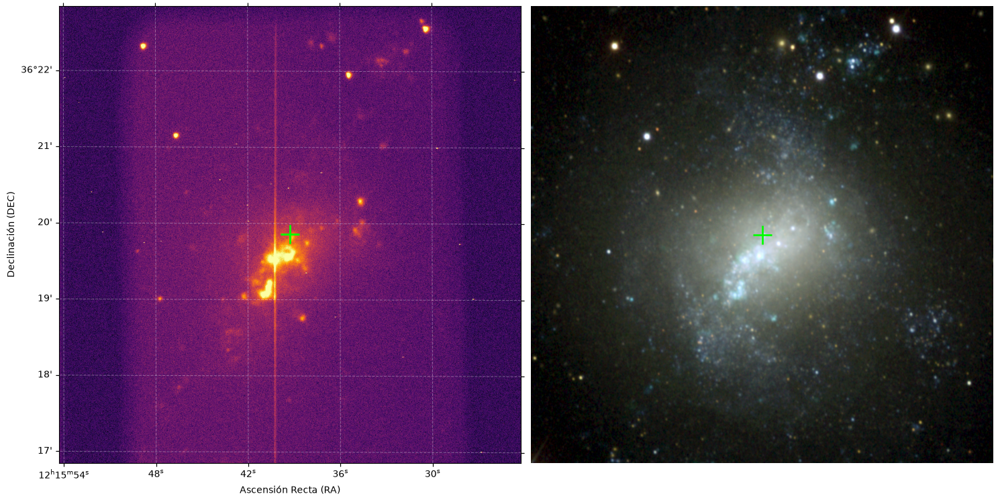

In [27]:
sky_location_helper("/home/hollman/GEHR_specs/2023jun_spm/nite01/IMAGES/Image_N42140001o.fits")

In [1]:
# Librerias esenciales

import os
from pathlib import Path
import shutil
from astropy.io import fits
from lacosmic import remove_cosmics
import matplotlib.pyplot as plt
import numpy as np
from joblib import Parallel, delayed
#import pyraf
from pyraf import iraf

work_dir = '/home/hollman/GEHR_specs/2023jun_spm/nite01/'

cannot access host 'iraf.noao.edu:80'


In [2]:
iraf.noao()
iraf.onedspec()

In [3]:
iraf.noao()
iraf.onedspec()

iraf.unlearn("aidpars")
iraf.unlearn("autoidentify")


In [4]:
iraf.aidpars(
    reflist    = "linelists$thar.dat",
    refspec    = "",

    # INDEF significa el píxel central del espectro
    crpix      = "INDEF",
    crquad     = "INDEF",

    # Buscar ambas orientaciones de la dispersión
    cddir      = "unknown",

    # Búsqueda amplia del cero puntual
    crsearch   = 15.0,

    # -0.5 significa ±50% del valor inicial de cdelt
    cdsearch   = -0.5,

    ntarget    = 15,
    npattern   = 3,
    nneighbors = 10,
    nbins      = 10,
    ndmax      = 500,

    # Primero intenta una relación lineal
    aidord     = 2,
    maxnl      = 0.05,

    # No exigir las seis líneas desde el comienzo
    nfound     = 4,

    sigma      = 0.20,
    minratio   = 0.03,

    # Criterios deliberadamente permisivos para diagnóstico
    rms        = 0.3,
    fmatch     = 0.80,

    # b: límites, t: picos detectados, f: solución final
    debug      = "btf",

    mode       = "ql"
)

In [5]:
original_dir = os.getcwd()
arcs_dir = os.path.abspath(f'{work_dir}ARCS')
os.chdir(arcs_dir)


arc_files = [f for f in os.listdir(f'{work_dir}ARCS') if f.endswith(".fits") and 'cr' in f.lower()]
arc_files.sort()

with open(f"{work_dir}ARCS/database/id{arc_files[0].replace('.fits', '')}", "w", encoding="ascii") as f:
    pass


In [6]:
#arc_image = f"{work_dir}ARCS/Arc0001o_crLA"

iraf.autoidentify(
    images      = arc_files[0],

    # Coordenada aproximada en el centro del espectro
    crval       = 6580.0,

    # Solo la magnitud; cddir="unknown" busca ambos sentidos
    cdelt       = -0.055,

    query       = "no",
    coordlist   = "linelists$thar.dat",
    units       = "angstroms",

    interactive = "YES",

    section     = "middle line",
    nsum        = 10,

    ftype       = "emission",

    # Valores permisivos para detectar primero los picos
    fwidth      = 5.0,
    cradius     = 5.0,
    threshold   = 0.0,
    minsep      = 2.0,

    # En píxeles por ser negativo
    match       = -5.0,

    # Solución lineal inicial
    function    = "chebyshev",
    order       = 2,

    sample      = "*",
    niterate    = 0,
    low_reject  = 3.0,
    high_reject = 3.0,
    grow        = 0.0,

    dbwrite     = "yes",
    overwrite   = "yes",
    database    = f"database",

    verbose     = "yes",
    logfile     = "autoidentify.log",
    plotfile    = ""
)


AUTOIDENTIFY: NOAO/IRAF V2.16.1 hollman@posgrado-PCGHIA-1 Tue 20:08:47 04-Aug-2026
  Spectrum                 # Found   Midpoint Dispersion        RMS
  Arc0001o_crLA[*,470]          26  6574.2151    -0.0557      0.149
    941.53  6550.0764  6550.1877 
Arc0001o_crLA[*,470]: Write results to database?